# Learn to use SOLensInterface

SOLensInterface seems to be the key class for running lensing analysis with solenspipe. 
So let's explore what it does.

In [1]:
import matplotlib.pyplot as plt
import os
os.environ["DISABLE_MPI"]="true"
from solenspipe import SOLensInterface, get_mask
import mapsims
from pixell import enplot, enmap
from falafel import qe
from orphics import maps
import healpy as hp
import numpy as np

/global/homes/m/maccrann/.conda/envs/lenspipe/lib/python3.7/site-packages/orphics/stats.py:15: UserWarning: Could not find pandas. Install using pip; FisherMatrix will not work otherwise
  warnings.warn("Could not find pandas. Install using pip; FisherMatrix will not work otherwise")


To initialize `SOLensInterface`, we need at the least, a mask. The function `get_mask` from solenspipe returns a default mask when called without arguments. So let's grab that, and plot it:

<class 'pixell.enmap.ndmap'>


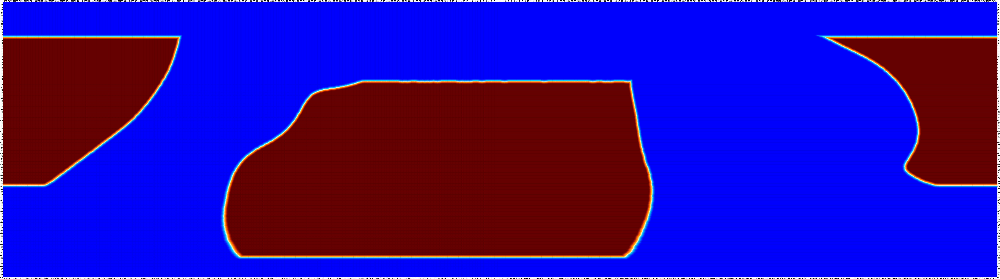

In [2]:
mask = get_mask()
print(type(mask))
enplot.show(enplot.plot(mask))

We can then initialize an SOLensInterface instance with this mask. 
Let's also set a noise level and a beam though (although those are not required arguments)

In [3]:
beam_fwhm = 1.4
white_noise = 30.
solensint = SOLensInterface(mask=mask, beam_fwhm=beam_fwhm,
                           white_noise=white_noise)

We can specify a channel and seed in order to generate (or access cached versions of)
maps from our `SOLensInterface` instance. We can get a channel instance using the `SOChannel` class from mapsims, which takes arguments telescope ("LA" or "SA" for large or small aperture telescope) and band (i.e. frequency band in GHz e.g. 145).

seed should be a tuple of three integers. Not sure what they mean yet so let's start with (0,0,0).

First let's get a noise map, using `get_noise_map`. Also print its shape

In [4]:
channel = mapsims.SOChannel("LA", 145)
seed = (0,0,0)
noise_map = solensint.get_noise_map(seed, channel)
print(noise_map.shape)

(3, 3000, 10800)


Plot this using enmap (actually plotting a downgraded version is a bit less intensive). Should look reassuringly boring as we have white noise here. There is some gradient in the vertical direction - what is this?

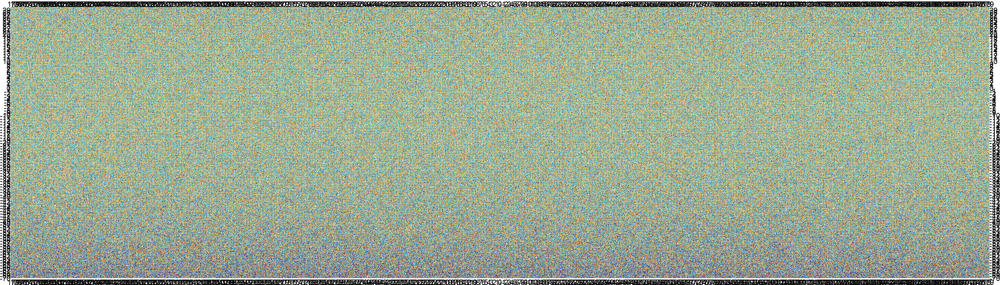

In [5]:
enplot.show(enplot.plot(enmap.downgrade(noise_map[0],4)))

Probably more interesting than the noise map is a kappa map. We start by getting the map $a_{lm}$s using `get_kmap`. It takes arguments channel, seed, lmin, lmax, and filtered (what kind of filtering is this?)

In [6]:
lmin,lmax=200,1000
kmap = solensint.get_kmap(channel,seed,lmin,lmax,filtered=True)

prepare map


To get kappa we need to do the reconstruction. This is done by the `get_mv_kappa` method of `SOLensInterface`. This expects arguments "polcomb" which is a string determining which combination of temperature and polarization to use (options are "mv","TT","TE","EB","TB","EE"). It returns the reconstructed kappa $a_{lm}$s.

In [7]:
t_alm,e_alm,b_alm = kmap
polcomb = "TT"
kappa_alms = solensint.get_mv_kappa(polcomb,t_alm,e_alm,b_alm)

These $a_{lm}$s are not normalized - we need the $A(L)$ function (from e.g. https://arxiv.org/abs/astro-ph/0111606) to normalize. The method `initialize_norm` calculates this, and has a long tuple of return values, which is an array of $L$ values (I assume), followed by several different $A(L)$s ($A(L)$ depends on which combinations of pairs of fields is being used for the reconstruction). 

In [10]:
#These these need to be filtered/normalized
ALs,ALs_curl = solensint.initialize_norm(channel,lmin,lmax,
                                       recalculate=True,use_cmblensplus=True)
Ls = ALs['L']

compute cmblensplus norm


We can now go ahead and apply the $A(L)$ filter, which returns our correctly
normalized kappa $a_{lm}$s.

In [11]:
alms_recon = qe.filter_alms(kappa_alms, maps.interp(Ls,ALs[polcomb]))

Ok, we've got our reconstructed $a_{lm}$s. Note we haven't done any mean field correction. But let's go ahead and plot the map anyway. 

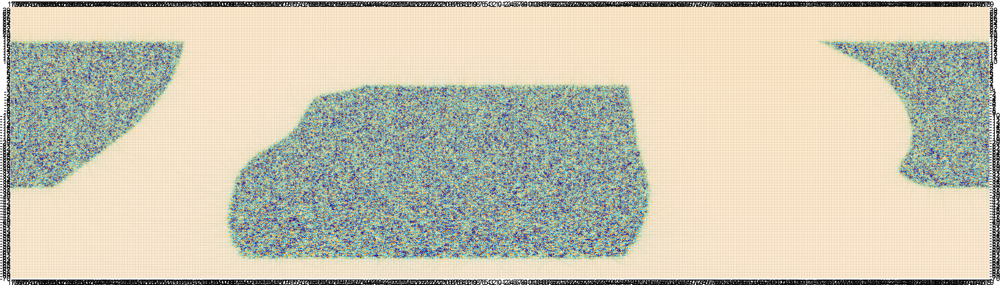

In [12]:
kappa_map = solensint.alm2map(alms_recon,ncomp=1)[0]
enplot.show(enplot.plot(enmap.downgrade(kappa_map,4)))

Now let's get the power spectrum. The reconstructed $C_l$s will be have noise bias, so we can check things are working by cross-correlating with the input $a_lm$s. We can get these using the `get_kapp_alm` method, which has one integer argument relating to which noise realization we want - this needs more documentation though. 

In [13]:
alms_input = solensint.get_kappa_alm(0)
cl_recon = hp.alm2cl(alms_recon,alms_recon)
cl_recon_input = hp.alm2cl(alms_recon, alms_input)
cl_input = hp.alm2cl(alms_input,alms_input)

We haven't yet accounted for the mask. We can do this by applying approximate corrections:

In [14]:
w2 = solensint.wfactor(2)
w3 = solensint.wfactor(3)
w4 = solensint.wfactor(4)
cl_recon /= w4
cl_recon_input /= w3
cl_input /= w2

Now plot these

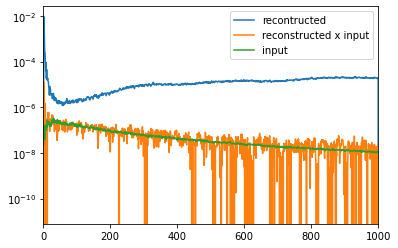

In [15]:
%matplotlib inline
ls = np.arange(cl_recon.size)
fig, ax = plt.subplots()
ax.plot(ls, cl_recon, label='recontructed')
ax.plot(ls, cl_recon_input, label='reconstructed x input')
ax.plot(ls, cl_input, label='input')
ax.set_yscale('log')
ax.set_xlim([0,lmax])
ax.legend()

### $\text{N}^0$ bias

Alright. Looks legit. Now let's see if we can do somethig about the noise
bias in the reconstructed $C_l$. The dominant contribution is I think $N^0$ bias, due to disconnected part of the CMB 4-point function, which is present even in the absence of lensing. We can calculate this in a few different ways. - For the isotropic noise case, it can be computed analytically, see e.g. eqn. 13 in https://arxiv.org/abs/2011.02475. This may still be a good ebough approximation if the noise is not too anisotropic e.g. a not too crazy mask, and white noise otherwise. 
- We can use compute it by getting the reconstructed $C_l$s on many simulations which don't have lensing signal. The accuracy depends linearly on $\Delta C_l$, which is the difference between the simulations and data $C_l$, so is very sensitive to simulation accuracy.
- We can use the $\text{RDN}^0$ approach of https://arxiv.org/abs/1008.4403, https://arxiv.org/abs/1209.0091, see e.g. eqn 17 of https://arxiv.org/abs/2011.02475.

Let's start with the third one actually, because I can't see
where code for the first two are. The `bias` module in solenspipe has 
a function `rdn0`. We pass this function the `get_kmap` method of our `solensint` instance, which tells it how to simulate maps. Similarly, the `power` argument expects a function to evaluate the power spectrum from two sets of $a_{lm}$s - this is just the healpy `alm2cl` function. We can't use `mpi` in a jupyter notebook at nersc, so just pass `comm=None`. Do `nsims=10` so don't have to wait too long.

In [16]:
from solenspipe import bias
#from orphics import mpi
comm=None
get_kmap = lambda seed: solensint.get_kmap(channel,
                                           seed,lmin,lmax,
                                           filtered=True)
power = lambda x,y: hp.alm2cl(x,y)
qfunc = solensint.qfunc

In [ ]:
nsims=5
rdn0 = bias.rdn0(icov=0,alpha=polcomb,beta=polcomb,
                 qfunc=qfunc,get_kmap=get_kmap,
                 comm=comm,power=power,nsims=nsims)

1
prepare map
main rdn0
[0.00000000e+00 5.19826376e+08 6.34722272e+09 ... 5.62929403e+05
 6.21879809e+05 0.00000000e+00]
non gaussian
prepare map
2
prepare map
main rdn0
[0.00000000e+00 2.77498308e+09 8.29146693e+09 ... 6.70619538e+05
 6.58824924e+05 0.00000000e+00]
non gaussian
prepare map
main rdn0


In [ ]:
print(rdn0)